In [3]:
import os

os.environ["CUDA_VISIBLE_DEVICES"]= '2'

import dgl
import h5py
import time
import numpy as np
import torch
import networkx as nx
from dgl.nn import GMMConv
import matplotlib.pyplot as plt
import torch.nn.functional as F
from GDL_CC_support import create_log_file_name, apply_filter, add_additive_noise, pre_processing, order_data, \
    mse_complex, mse_complex_summed, order_data_single_input

#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

device = torch.device('cuda')

from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [4]:
path_to_data = '../../tmp_folder_27/'
name_dataset = 'DATA_CRT_32_sim_ver6.h5'
f_handle = h5py.File(path_to_data+name_dataset,'r')

In [5]:
f_handle['input_data'].shape

(33600, 6208, 40)

In [6]:
n_cases = f_handle['input_data'].shape[0]
n_kspoint = f_handle['input_data'].shape[1]
n_coil = f_handle['input_data'].shape[2]
n_cases = 25

sta_time = time.time()
x_raw = torch.tensor(f_handle['input_data'][:n_cases,:n_kspoint,:n_coil], dtype=torch.float32)
y_raw = torch.tensor(f_handle['output_data'][:n_cases,:n_kspoint,:n_coil], dtype=torch.float32)
print('Load in ', time.time()-sta_time)


sta_time = time.time()
af_mat = torch.tensor(
    np.repeat(
        np.array(
            f_handle['AF_vec']).transpose(), 
        40, axis=1), 
    dtype=torch.float32)

hf_mat = torch.tensor(
    np.repeat(
        np.array(
            f_handle['HF_vec']).transpose(), 
        40, axis=1), 
    dtype=torch.float32)

edge_attr_raw = torch.tensor(np.array(f_handle['edge_attr']), dtype=torch.float32)
edge_index_raw = torch.tensor(np.array(f_handle['edge_index']) - 1,
                              dtype=torch.long)  # minus one is because of different indexinf between python and matlab

pkor = torch.tensor(np.array(f_handle['pkor_vec']), dtype=torch.float32).to(device)

print('Load the rest in ', time.time()-sta_time)

sta_time = time.time()
x_pp, x_vl_pp, norm_x = pre_processing(x_raw, af_mat, hf_mat, n_coi=20)
y_pp, y_vl_pp, norm_y = pre_processing(y_raw, af_mat, hf_mat, n_coi=20)
print('Load in ', time.time()-sta_time)

g = dgl.graph((edge_index_raw[0,:], edge_index_raw[1,:])).to(device)
g.edata['w'] = edge_attr_raw.to(device)

pkor = torch.tensor(np.array(f_handle['pkor_vec']), dtype=torch.float32).to(device)

Load in  0.40526700019836426
Load the rest in  4.647598743438721
Load in  0.03147554397583008


In [6]:
pkor.max()

tensor(0.2950, device='cuda:0')

In [7]:
f_handle['input_data'].shape[0]

33600

In [7]:
class Net(torch.nn.Module):
    def __init__(self, in_chan, out_chan):
        super(Net, self).__init__()
        self.conv1 = GMMConv(in_chan, 20, 2, 10, 'mean', bias=False)
        torch.nn.init.uniform_(self.conv1.mu, -0.2950, 0.2950)
        torch.nn.init.uniform_(self.conv1.inv_sigma, 10, 11)
        #self.conv2 = GMMConv(20, 20, 2, 10, 'mean', bias=False)
        self.conv3 = GMMConv(20, 40, 2, 10, 'mean', bias=False)
        torch.nn.init.uniform_(self.conv3.mu, -0.2950, 0.2950)
        torch.nn.init.uniform_(self.conv3.inv_sigma, 10, 11)
        
    def forward(self, g, featu, p_coord):
        x = torch.tanh(self.conv1(g, featu, p_coord))
        #x = torch.relu(self.conv2(g, x, p_coord))
        x = self.conv3(g, x, p_coord)
        return x
        
model = Net(in_chan = 40, out_chan = 40).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.005)

In [7]:
#model.load_state_dict(torch.load('./Saved_model_dgl_2_trained_withnoise.pt'))

In [8]:
def train(data_train_x, data_train_y, mini_batch=10, noise_lvl=0):
    model.train()
    total_loss = 0
    mini_batch_idx = 0
    mini_batch_loss = 0
    
    for i in np.arange(data_train_x.shape[0]):
        mini_batch_idx += 1
        inn = data_train_x[i, ].to(device)
        # inn = data_b.x
        # inn = data_b.x * gf_mat

        # inn = (data_b.x + (epoch * noise_lvl * 8.4375e+09) * torch.randn_like(data_b.x)) * gf_mat
        # dat = dat + nois_lvl * torch.tensor(np.random.standard_normal(dat.shape), dtype=torch.float32).cuda()
        # inn = add_additive_noise(data_b.x, 10*epoch, cuda_mod=True) * gf_mat
        # inn = data_b.x

        optimizer.zero_grad()
        pred = model(g, inn, pkor)
        loss = F.mse_loss(pred, data_train_y[i, ].to(device))
        # loss_2 = mse_complex_summed(pred, data_b.y, n_coi=1)
        # loss = loss_1 + loss_2
        # loss2 = mse_complex(pred, data_b.y)
        mini_batch_loss += loss / mini_batch
        #
        if mini_batch_idx == mini_batch:
            mini_batch_loss.backward()
            optimizer.step()
            mini_batch_idx = 0
            mini_batch_loss = 0

        total_loss += loss / x_raw.shape[0]
    return total_loss

In [9]:
N = n_cases
old_loss = 0
g_filt = (hf_mat * af_mat) / norm_x 
for epoch in range(1,50):
    sta = time.time()

    cur_loss = train(x_pp[0:N,], y_pp[0:N,])
    #cur_loss = train_with_noise(x_raw[0:N,], y_pp[0:N,], g_filt.to(device))
    # tes_loss, tes_va = test()
    sto = time.time() - sta
    
    delt_loss = old_loss - cur_loss
    
    
    # log = 'Epoch: {:03d}, Train: {:.8f}, Validation: Mean {:.8f}, Variance {:.8f}, Time: {:.4f}'
    log = 'Epoch: {:03d}, Train: {:.8f}, Time: {:.4f}, Change in loss: {:.8f}'

    print(log.format(epoch, cur_loss, sto,delt_loss))
    old_loss = cur_loss

Epoch: 001, Train: 0.00001278, Time: 495.0116, Change in loss: -0.00001278
Epoch: 002, Train: 0.00000644, Time: 498.0845, Change in loss: 0.00000634
Epoch: 003, Train: 0.00000571, Time: 494.1603, Change in loss: 0.00000073
Epoch: 004, Train: 0.00000551, Time: 491.5352, Change in loss: 0.00000020
Epoch: 005, Train: 0.00000535, Time: 494.4852, Change in loss: 0.00000015
Epoch: 006, Train: 0.00000523, Time: 497.2934, Change in loss: 0.00000012
Epoch: 007, Train: 0.00000513, Time: 492.8152, Change in loss: 0.00000010
Epoch: 008, Train: 0.00000506, Time: 494.4658, Change in loss: 0.00000007
Epoch: 009, Train: 0.00000501, Time: 492.6835, Change in loss: 0.00000005
Epoch: 010, Train: 0.00000497, Time: 496.8369, Change in loss: 0.00000004
Epoch: 011, Train: 0.00000495, Time: 496.5455, Change in loss: 0.00000002
Epoch: 012, Train: 0.00000492, Time: 494.1290, Change in loss: 0.00000002
Epoch: 013, Train: 0.00000492, Time: 494.3965, Change in loss: 0.00000001
Epoch: 014, Train: 0.00000491, Time: 

In [18]:
'''Epoch: 001, Train: 0.00006393, Time: 368.1847, Change in loss: -0.00006393
Epoch: 002, Train: 0.00002317, Time: 369.2126, Change in loss: 0.00004076
Epoch: 003, Train: 0.00001493, Time: 371.0796, Change in loss: 0.00000824
Epoch: 004, Train: 0.00001118, Time: 369.8623, Change in loss: 0.00000375
Epoch: 005, Train: 0.00000930, Time: 373.5658, Change in loss: 0.00000189
Epoch: 006, Train: 0.00000823, Time: 367.7220, Change in loss: 0.00000107
Epoch: 007, Train: 0.00000758, Time: 370.6556, Change in loss: 0.00000065
Epoch: 008, Train: 0.00000714, Time: 370.2973, Change in loss: 0.00000044
Epoch: 009, Train: 0.00000683, Time: 368.7459, Change in loss: 0.00000031
Epoch: 010, Train: 0.00000661, Time: 368.9247, Change in loss: 0.00000022
Epoch: 011, Train: 0.00000645, Time: 369.3268, Change in loss: 0.00000016
Epoch: 012, Train: 0.00000632, Time: 371.0943, Change in loss: 0.00000013
Epoch: 013, Train: 0.00000622, Time: 370.2576, Change in loss: 0.00000011
Epoch: 014, Train: 0.00000612, Time: 371.9070, Change in loss: 0.00000010
Epoch: 015, Train: 0.00000603, Time: 368.7472, Change in loss: 0.00000009
Epoch: 016, Train: 0.00000594, Time: 370.8783, Change in loss: 0.00000009
Epoch: 017, Train: 0.00000587, Time: 371.2407, Change in loss: 0.00000007
Epoch: 018, Train: 0.00000582, Time: 370.4082, Change in loss: 0.00000005
Epoch: 019, Train: 0.00000577, Time: 369.2258, Change in loss: 0.00000005
Epoch: 020, Train: 0.00000573, Time: 369.9668, Change in loss: 0.00000004
Epoch: 021, Train: 0.00000571, Time: 369.8532, Change in loss: 0.00000003
Epoch: 022, Train: 0.00000568, Time: 369.6779, Change in loss: 0.00000002
Epoch: 023, Train: 0.00000567, Time: 369.7984, Change in loss: 0.00000002'''

'Epoch: 001, Train: 0.00006393, Time: 368.1847, Change in loss: -0.00006393\nEpoch: 002, Train: 0.00002317, Time: 369.2126, Change in loss: 0.00004076\nEpoch: 003, Train: 0.00001493, Time: 371.0796, Change in loss: 0.00000824\nEpoch: 004, Train: 0.00001118, Time: 369.8623, Change in loss: 0.00000375\nEpoch: 005, Train: 0.00000930, Time: 373.5658, Change in loss: 0.00000189\nEpoch: 006, Train: 0.00000823, Time: 367.7220, Change in loss: 0.00000107\nEpoch: 007, Train: 0.00000758, Time: 370.6556, Change in loss: 0.00000065\nEpoch: 008, Train: 0.00000714, Time: 370.2973, Change in loss: 0.00000044\nEpoch: 009, Train: 0.00000683, Time: 368.7459, Change in loss: 0.00000031\nEpoch: 010, Train: 0.00000661, Time: 368.9247, Change in loss: 0.00000022\nEpoch: 011, Train: 0.00000645, Time: 369.3268, Change in loss: 0.00000016\nEpoch: 012, Train: 0.00000632, Time: 371.0943, Change in loss: 0.00000013\nEpoch: 013, Train: 0.00000622, Time: 370.2576, Change in loss: 0.00000011\nEpoch: 014, Train: 0.00

0.16714343326144376 0.5676962939387112 -0.55650246 -0.15066984


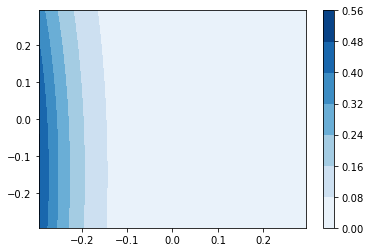

0.2204191507130994 0.08909136789731573 0.6575805 0.24291329


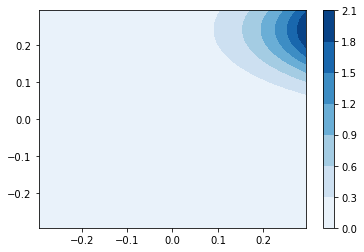

0.14681550360158463 0.25416926458235906 0.5193332 -0.08420744


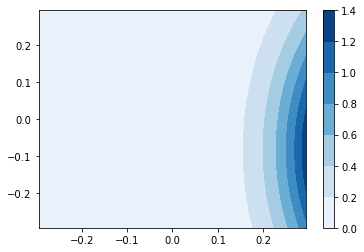

0.15689680170684164 0.17899527852019445 -0.35120422 0.4483734


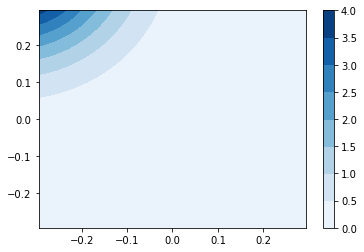

0.4710861770263858 0.15614861918261044 -0.13902783 -0.50197953


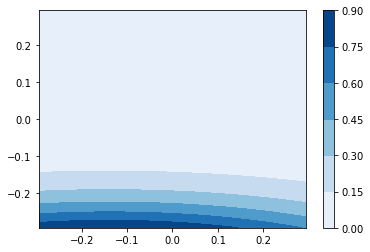

0.024537408024735096 0.025614838595952264 -0.014465909 0.0020648227


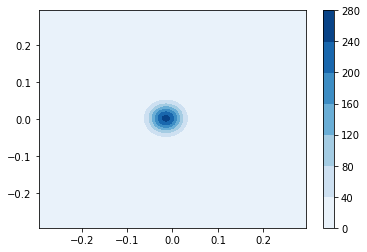

14.706050740568799 0.16810822852180252 -0.0077800592 0.60070276


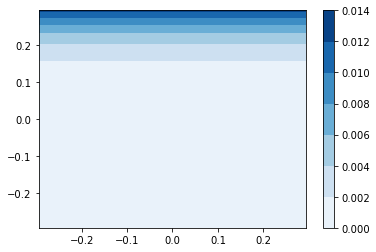

0.06913997750360724 0.06895354906174403 -0.24733411 0.6406739


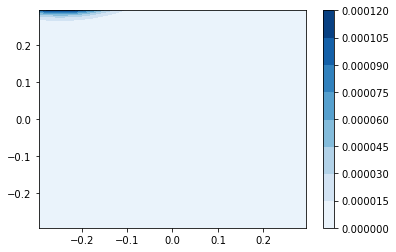

0.16047449872379604 0.11870568670536068 0.41414684 -0.286343


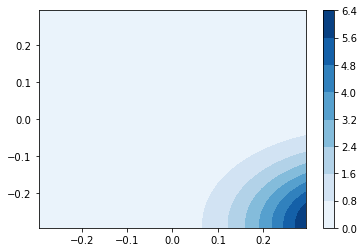

In [46]:
z0 = 0
for i in np.arange(0,9):
    s1 = 1/np.array(model.conv1.inv_sigma[i].cpu().detach())[0]
    s2 = 1/np.array(model.conv1.inv_sigma[i].cpu().detach())[1]
    
    m1 = np.array(model.conv1.mu[i].cpu().detach())[0]
    m2 = np.array(model.conv1.mu[i].cpu().detach())[1]
    print(s1,s2,m1,m2)
    size = 100
    
    x = np.linspace(-0.2950, 0.2950, size)
    y = np.linspace(-0.2950, 0.2950, size)
    
    x, y = np.meshgrid(x, y)

    z = (1/(2*np.pi*s1*s2) * np.exp(-((x-m1)**2/(2*s1**2)
         + (y-m2)**2/(2*s2**2))))
    z0 = z0 + z
        
    plt.contourf(x, y, z, cmap='Blues')
    plt.colorbar()
    plt.show()

In [38]:
def train_with_noise(data_train_x, data_train_y, g_filt, mini_batch=10, noise_lvl=0):
    model.train()
    total_loss = 0
    mini_batch_idx = 0
    mini_batch_loss = 0
    maximum_signal = data_train_x.max() * 0.0005
    
    for i in np.arange(data_train_x.shape[0]):
        mini_batch_idx += 1
        inn = data_train_x[i, ]
        nois = maximum_signal * torch.rand(1) * epoch * torch.randn_like(inn)
        inn = (inn.to(device) + nois.to(device)) * g_filt
        # inn = data_b.x
        # inn = data_b.x * gf_mat

        # inn = (data_b.x + (epoch * noise_lvl * 8.4375e+09) * torch.randn_like(data_b.x)) * gf_mat
        # dat = dat + nois_lvl * torch.tensor(np.random.standard_normal(dat.shape), dtype=torch.float32).cuda()
        # inn = add_additive_noise(data_b.x, 10*epoch, cuda_mod=True) * gf_mat
        # inn = data_b.x

        optimizer.zero_grad()
        pred = model(g, inn, pkor)
        loss = F.mse_loss(pred, data_train_y[i, ].to(device))
        # loss_2 = mse_complex_summed(pred, data_b.y, n_coi=1)
        # loss = loss_1 + loss_2
        # loss2 = mse_complex(pred, data_b.y)
        mini_batch_loss += loss / mini_batch
        #
        if mini_batch_idx == mini_batch:
            mini_batch_loss.backward()
            optimizer.step()
            mini_batch_idx = 0
            mini_batch_loss = 0

        total_loss += loss / x_raw.shape[0]
    return total_loss

In [39]:
N = n_cases
old_loss = 0
g_filt = (hf_mat * af_mat) / norm_x 
for epoch in range(1,30):
    sta = time.time()

    #cur_loss = train(x_pp[0:N,], y_pp[0:N,])
    cur_loss = train_with_noise(x_raw[0:N,], y_pp[0:N,], g_filt.to(device))
    # tes_loss, tes_va = test()
    sto = time.time() - sta
    
    delt_loss = old_loss - cur_loss
    
    
    # log = 'Epoch: {:03d}, Train: {:.8f}, Validation: Mean {:.8f}, Variance {:.8f}, Time: {:.4f}'
    log = 'Epoch: {:03d}, Train: {:.8f}, Time: {:.4f}, Change in loss: {:.8f}'

    print(log.format(epoch, cur_loss, sto,delt_loss))
    old_loss = cur_loss

Epoch: 001, Train: 0.00000465, Time: 580.8218, Change in loss: -0.00000465
Epoch: 002, Train: 0.00000465, Time: 1308.2012, Change in loss: -0.00000000
Epoch: 003, Train: 0.00000466, Time: 1262.5854, Change in loss: -0.00000001
Epoch: 004, Train: 0.00000472, Time: 584.1025, Change in loss: -0.00000006
Epoch: 005, Train: 0.00000478, Time: 583.1555, Change in loss: -0.00000006
Epoch: 006, Train: 0.00000485, Time: 581.4897, Change in loss: -0.00000007
Epoch: 007, Train: 0.00000494, Time: 581.7058, Change in loss: -0.00000009
Epoch: 008, Train: 0.00000503, Time: 582.3705, Change in loss: -0.00000009
Epoch: 009, Train: 0.00000514, Time: 584.6188, Change in loss: -0.00000011
Epoch: 010, Train: 0.00000525, Time: 580.8302, Change in loss: -0.00000011
Epoch: 011, Train: 0.00000534, Time: 583.3144, Change in loss: -0.00000010
Epoch: 012, Train: 0.00000545, Time: 583.2339, Change in loss: -0.00000011
Epoch: 013, Train: 0.00000554, Time: 583.9500, Change in loss: -0.00000010
Epoch: 014, Train: 0.00

In [45]:
torch.save(model.state_dict(), './Saved_model_dgl_3_50e_70eWN.pt')

In [8]:
model.load_state_dict(torch.load('./Saved_model_dgl_3_50e_70eWN.pt'))

<All keys matched successfully>

In [ ]:
'''Epoch: 001, Train: 0.00000816, Time: 715.9176, Change in loss: -0.00000816
Epoch: 002, Train: 0.00000834, Time: 709.7701, Change in loss: -0.00000017
Epoch: 003, Train: 0.00000856, Time: 708.0399, Change in loss: -0.00000022
Epoch: 004, Train: 0.00000877, Time: 706.8585, Change in loss: -0.00000021
Epoch: 005, Train: 0.00000897, Time: 712.1001, Change in loss: -0.00000020
Epoch: 006, Train: 0.00000923, Time: 712.5157, Change in loss: -0.00000027
Epoch: 007, Train: 0.00000947, Time: 711.1768, Change in loss: -0.00000023
Epoch: 008, Train: 0.00000970, Time: 711.6582, Change in loss: -0.00000023
Epoch: 009, Train: 0.00000993, Time: 710.6126, Change in loss: -0.00000023
Epoch: 010, Train: 0.00001017, Time: 714.5732, Change in loss: -0.00000025
Epoch: 011, Train: 0.00001039, Time: 706.0809, Change in loss: -0.00000021
Epoch: 012, Train: 0.00001063, Time: 712.9559, Change in loss: -0.00000024
Epoch: 013, Train: 0.00001093, Time: 703.3874, Change in loss: -0.00000030
Epoch: 014, Train: 0.00001120, Time: 710.1051, Change in loss: -0.00000027
Epoch: 015, Train: 0.00001144, Time: 708.6073, Change in loss: -0.00000024
Epoch: 016, Train: 0.00001168, Time: 707.6418, Change in loss: -0.00000024
Epoch: 017, Train: 0.00001198, Time: 707.3822, Change in loss: -0.00000030'''

In [9]:
def test(dat_to_test):
    model.eval()
    pred_all = []
    for i in np.arange(dat_to_test.shape[0]):
        inn = dat_to_test[i, ].to(device)
        pred = model(g, inn, pkor)
        pred_all.append(pred.cpu().detach().numpy())
    return pred_all

def test_2(x,h,a,norm):
    model.eval()
    pred_all = []
    g_filt = ((h*a)/norm).to(device)
    # inn = (data_b.x + (epoch * noise_lvl * 8.4375e+09) * torch.randn_like(data_b.x)) * gf_matnoise_lvl
    noise_lvl = x.max() * 0.0001 * 30
    for i in np.arange(x.shape[0]):
        inn = x[i, ].to(device)
        inn = (inn + noise_lvl * torch.randn_like(inn)) * g_filt
        pred = model(g, inn, pkor)
        pred_all.append(pred.cpu().detach().numpy())
    return pred_all

In [10]:
N=160
y_pp_pred = test(x_pp[0:N])
y_pp_pred2 = test_2(x_raw[0:N,],hf_mat,af_mat,norm_x)

In [11]:
cae = 25
#coi =
for coi in np.arange(21,40):
    fig = go.Figure()
    fig.add_trace(go.Scatter(y=y_pp_pred[cae][:,coi],name='Pred'));
    fig.add_trace(go.Scatter(y=y_pp[cae,:,coi],name='GT'))
    fig.show()

IndexError: list index out of range

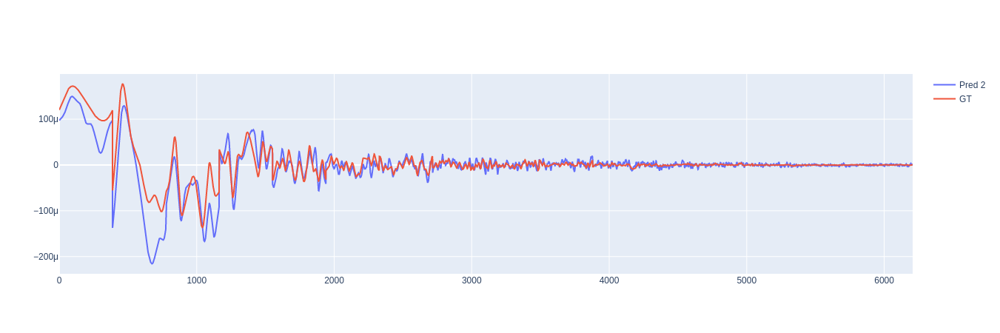

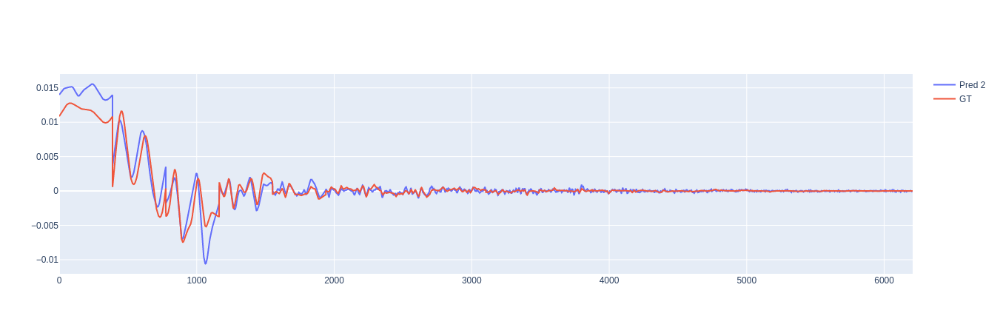

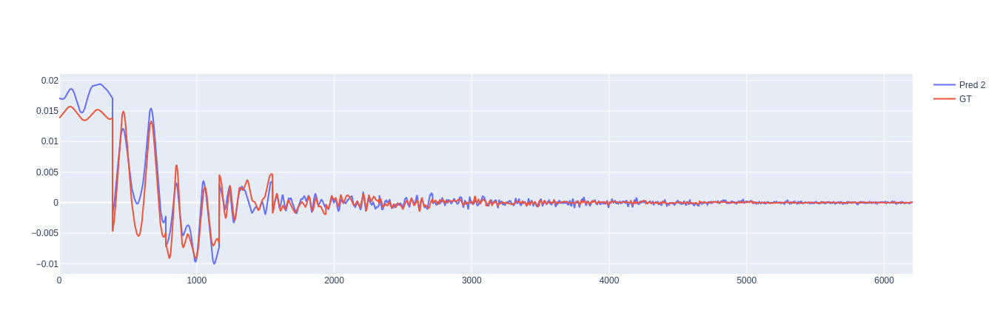

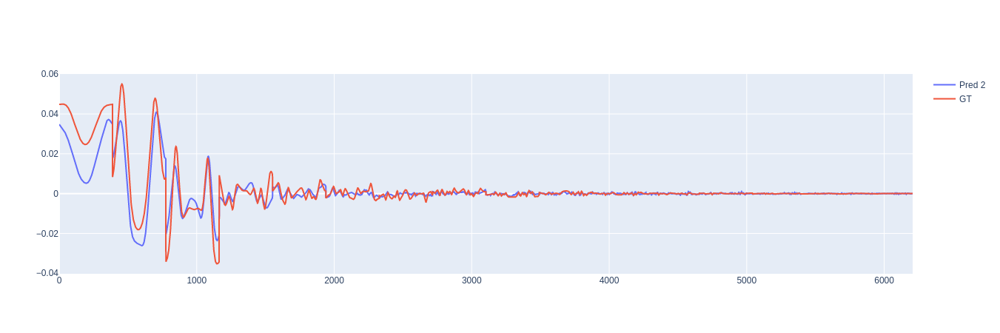

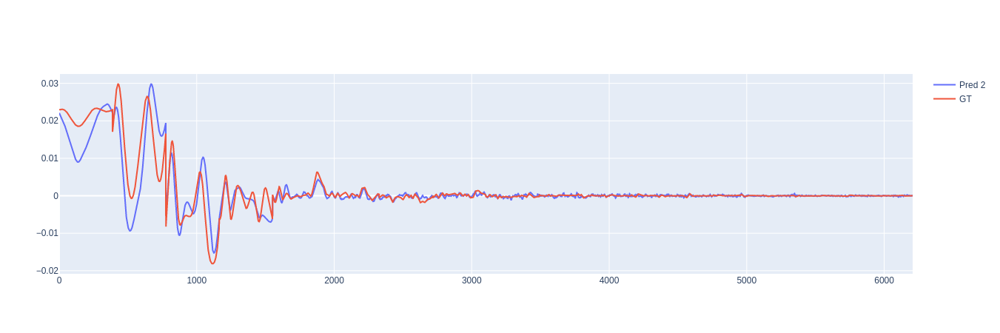

...

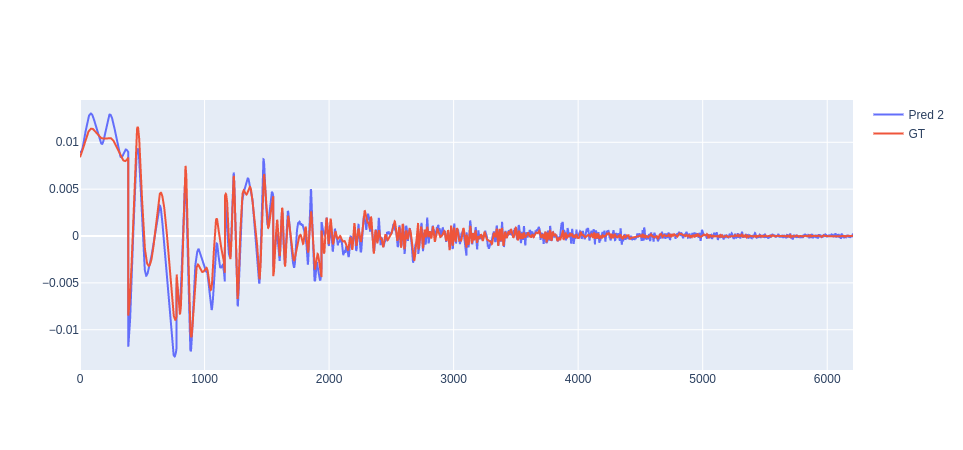

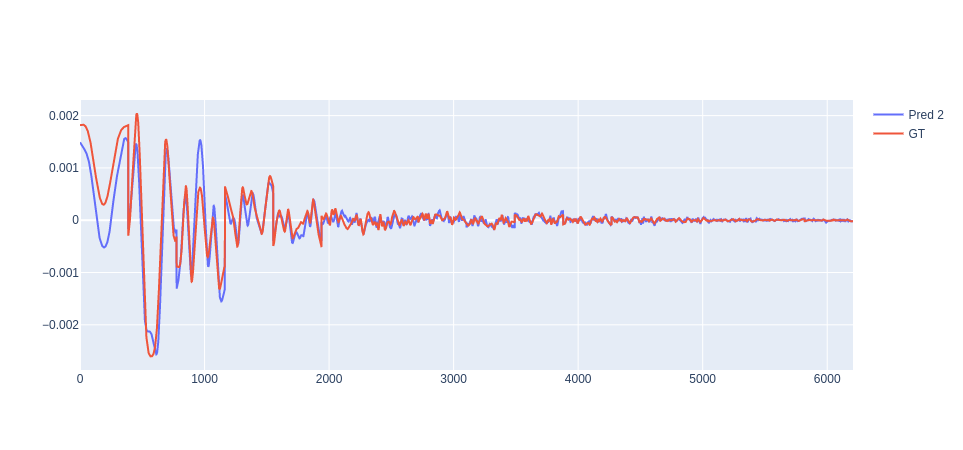

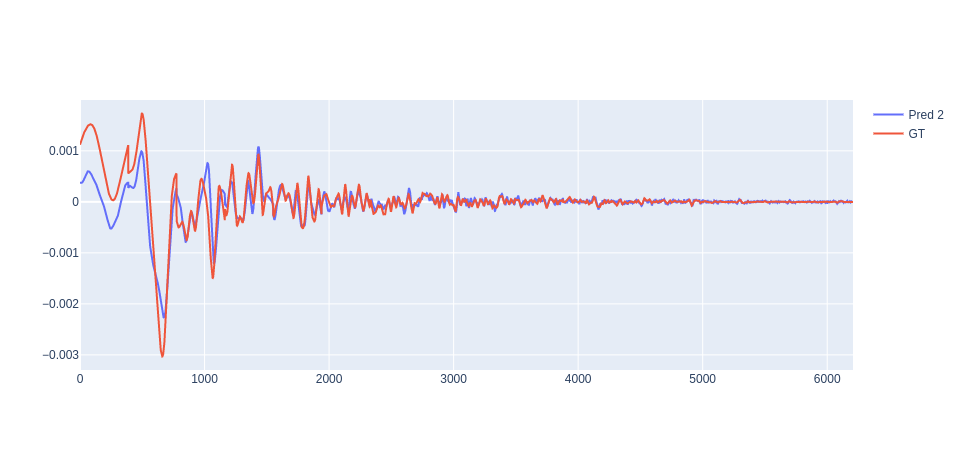

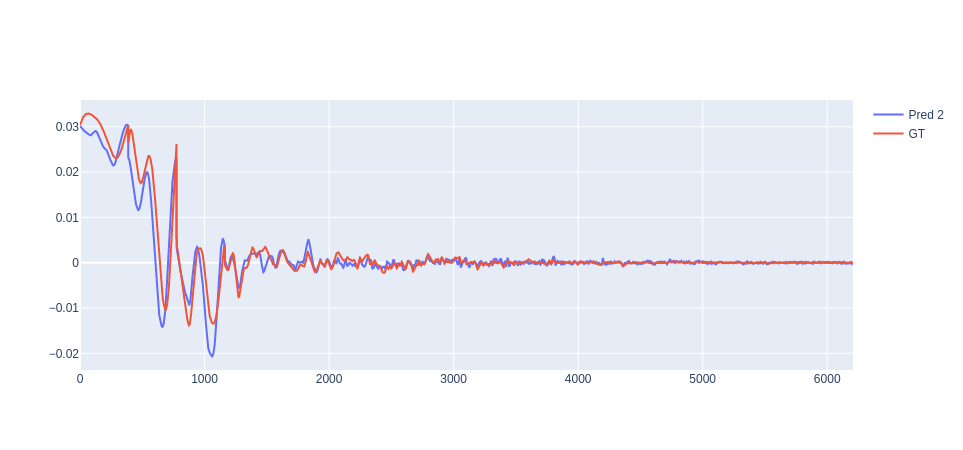

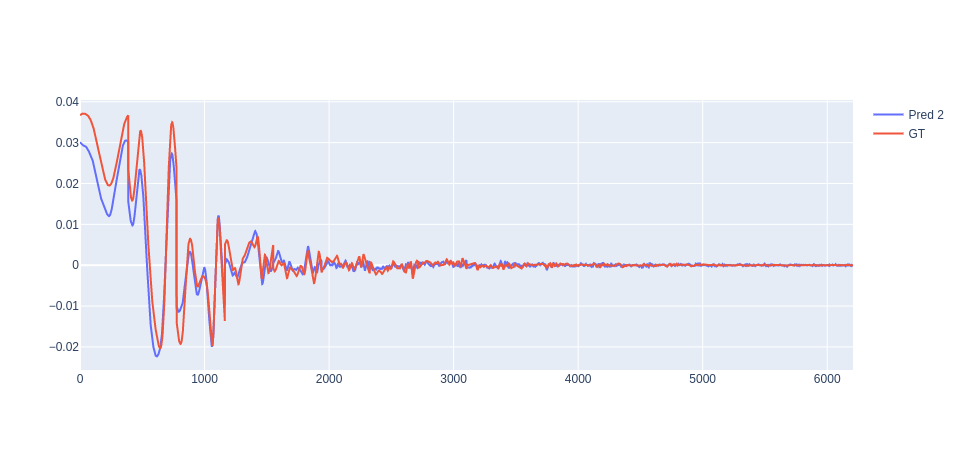

In [42]:
cae = 24
for coi in np.arange(21,40):
    fig = go.Figure()
    fig.add_trace(go.Scatter(y=y_pp_pred2[cae][:,coi],name='Pred 2'));
    fig.add_trace(go.Scatter(y=y_pp[cae,:,coi],name='GT'))
    fig.show()

In [ ]:
cae = 1
for coi in np.arange(0,20):
    ''
    fig = go.Figure()
    fig.add_trace(go.Scatter(y=y_pp_pred[cae][:,coi],name='Pred'));
    fig.add_trace(go.Scatter(y=y_pp[cae,:,coi].numpy(),name='GT'));
    fig.show()

In [ ]:
print(y_pp.shape)
print(y_pp_pred.__len__())
print(y_pp_pred[1].shape)

In [70]:
def interfer_with_test_data(pth2data, data_nam, labell, pth2save):
    
    sta_time = time.time()
    fh = h5py.File(pth2data+data_nam,'r')
    x_test = torch.tensor(fh[labell][:,:6208,:40],dtype=torch.float32)
    fh.close()
    print('Loaded in ', time.time()-sta_time)
    
    sta_time = time.time()
    x_test_pp, dd, ddd = pre_processing(x_test, af_mat, hf_mat, n_coi=20)
    x_test_pred = test(x_test_pp)
    print('Predicted in ', time.time()-sta_time)
    
    sta_time = time.time()
    fh = h5py.File(pth2save,'a')
    fh.create_dataset(labell+'_pr', data=x_test_pred)
    fh.create_dataset(labell+'_in', data=x_test_pp)
    fh.close()
    print('Saved in ', time.time()-sta_time)

    

In [12]:
def interfer_with_test_data_add_noise(pth2data, data_nam, labell, pth2save):
    
    sta_time = time.time()
    fh = h5py.File(pth2data+data_nam,'r')
    x_test = torch.tensor(fh[labell][:,:6208,:40],dtype=torch.float32)
    fh.close()
    print('Loaded in ', time.time()-sta_time)
    
    # add noise based on the maximum apmlitude in data
    max_a = x_test.max()
    
    
    sta_time = time.time()
    x_test, dd, ddd = pre_processing(x_test, af_mat, hf_mat, n_coi=20)
    x_test_pred = test(x_test)
    print('Predicted in ', time.time()-sta_time)
    
    sta_time = time.time()
    fh = h5py.File(pth2save,'a')
    fh.create_dataset(labell+'_pr', data=x_test_pred)
    fh.close()
    print('Saved in ', time.time()-sta_time)
    
    
    
    

In [68]:
pth2data = '../../'
data_nam = 'Valid_Test_Vol_011_FN_pos_00.h5'

pth2save = 'March_Output_Vol_11_pos_00_with_noise_2.h5'

labell = 'dat_vl'
sta_time = time.time()
fh = h5py.File(pth2data+data_nam,'r')
x_test_orig = torch.tensor(fh[labell][:,:6208,:40],dtype=torch.float32)
fh.close()
print('Loaded in ', time.time()-sta_time)

sta_time = time.time()
x_test, dd, ddd = pre_processing(x_test_orig, af_mat, hf_mat, n_coi=20)
x_test_pred = test(x_test)
print('Orig no extra noise done in ', time.time()-sta_time)

# add noise based on the maximum apmlitude in data
max_a = x_test_orig.max()

fh = h5py.File(pth2save,'a')


sta_time = time.time()
n_lvl = 0.0001

x_test_nois = x_test_orig + (max_a * n_lvl) * torch.randn_like(x_test)
#x_test_nois = x_test_orig + (max_a * 0) * torch.randn_like(x_test)
x_test_nois_pp, dd, ddd = pre_processing(x_test_nois, af_mat, hf_mat, n_coi=20)
x_test_nois_pred = test(x_test_nois_pp)

fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'in',n_lvl), data=x_test_nois)
fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'pr',n_lvl), data=x_test_nois_pred)
print('1st done in ', time.time()-sta_time)


sta_time = time.time()
n_lvl = 0.0005

x_test_nois = x_test_orig + (max_a * n_lvl) * torch.randn_like(x_test)
x_test_nois_pp, dd, ddd = pre_processing(x_test_nois, af_mat, hf_mat, n_coi=20)
x_test_nois_pred = test(x_test_nois_pp)

fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'in',n_lvl), data=x_test_nois)
fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'pr',n_lvl), data=x_test_nois_pred)
print('2nd done in ', time.time()-sta_time)


sta_time = time.time()
n_lvl = 0.001

x_test_nois = x_test_orig + (max_a * n_lvl) * torch.randn_like(x_test)
x_test_nois_pp, dd, ddd = pre_processing(x_test_nois, af_mat, hf_mat, n_coi=20)
x_test_nois_pred = test(x_test_nois_pp)

fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'in',n_lvl), data=x_test_nois)
fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'pr',n_lvl), data=x_test_nois_pred)
print('3rd done in ', time.time()-sta_time)


sta_time = time.time()
n_lvl = 0.0015

x_test_nois = x_test_orig + (max_a * n_lvl) * torch.randn_like(x_test)
x_test_nois_pp, dd, ddd = pre_processing(x_test_nois, af_mat, hf_mat, n_coi=20)
x_test_nois_pred = test(x_test_nois_pp)

fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'in',n_lvl), data=x_test_nois)
fh.create_dataset('{:s}_{:s}_{:.5f}'.format(labell,'pr',n_lvl), data=x_test_nois_pred)
print('4th done in ', time.time()-sta_time)



fh.close()


Loaded in  50.27721118927002
Orig no extra noise done in  38.160141944885254
1st done in  73.19634985923767
2nd done in  69.14473867416382
3rd done in  66.15236973762512
4th done in  79.75602889060974


In [55]:
noise = (max_a * n_lvl) * torch.randn_like(x_test)
#x_test_nois = x_test + 

print('size of the data: ',x_test.shape)
print('size of the extra noise: ',noise.shape)

In [57]:
print('size of the data: ',x_test.shape)
print('size of the extra noise: ',noise.shape)


size of the data:  torch.Size([5760, 6208, 40])
size of the extra noise:  torch.Size([5760, 6208, 40])


In [46]:
fh = h5py.File(pth2save,'r')
print(fh.keys())
fh.close()

<KeysViewHDF5 ['dat_vl__in_0.0010', 'dat_vl__in_0.0050', 'dat_vl__in_0.0100', 'dat_vl__in_0.0500', 'dat_vl__pr_0.0010', 'dat_vl__pr_0.0050', 'dat_vl__pr_0.0100', 'dat_vl__pr_0.0500', 'dat_vl_pr']>


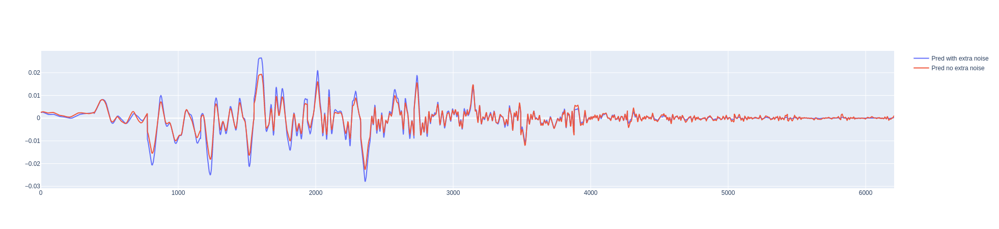

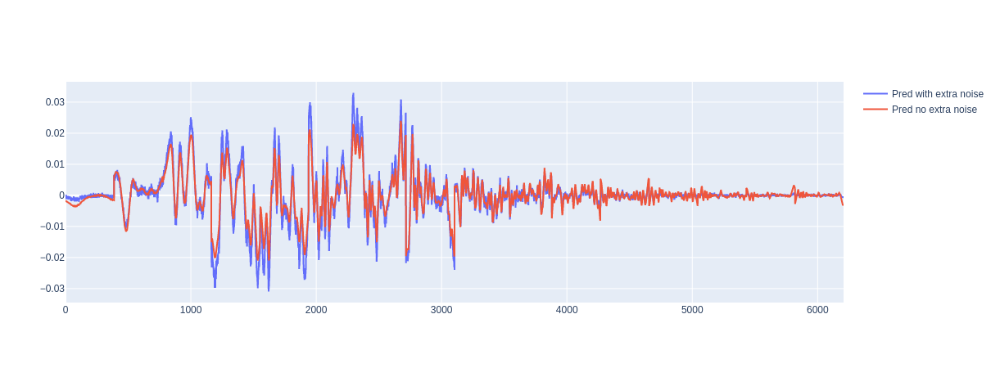

In [34]:
'''x_test_nois_pred.__len__()
x_test_nois.shape
'''

cai = 19
coi = 10


fig = go.Figure()
fig.add_trace(go.Scatter(y=x_test_nois_pred[cai][:,coi],name='Pred with extra noise'));
fig.add_trace(go.Scatter(y=x_test_pred[cai][:,coi],name='Pred no extra noise'));
fig.show()


fig = go.Figure()

fig.add_trace(go.Scatter(y=x_test_nois[cai,:,coi],name='Pred with extra noise'));
fig.add_trace(go.Scatter(y=x_test[cai,:,coi],name='Pred no extra noise'));
fig.show()



In [ ]:
path_to_data = '../../'
save_name_mrsi = 'Output_new_vol_1_val4.h5'

interfer_with_test_data(path_to_data, 'Valid_Test_Vol_001_BS.h5', 'dat_vl', save_name_mrsi)
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_001_BS.h5', 'dat_ts', save_name_mrsi)

In [14]:
path_to_data = '../../'

save_name_mrsi = 'Janurary_Output_new_vol_1_new2.h5'

#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_001_BS.h5', 'dat_vl', save_name_mrsi)
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_001_BS.h5', 'dat_ts', save_name_mrsi)

save_name_mrsi = 'Janurary_Output_new_vol_2_new2.h5'

#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_002_LH.h5', 'dat_vl', save_name_mrsi)
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_002_LH.h5', 'dat_ts', save_name_mrsi)

save_name_mrsi = 'Janurary_Output_new_vol_4_new2.h5'

#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_004_AL.h5', 'dat_vl', save_name_mrsi)
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_004_AL.h5', 'dat_ts', save_name_mrsi)

save_name_mrsi = 'Janurary_Output_new_vol_8_new2.h5'

#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_008_LP.h5', 'dat_vl', save_name_mrsi)
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_008_LP.h5', 'dat_ts', save_name_mrsi)

save_name_mrsi = 'Janurary_Output_new_vol_9_new2.h5'

#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_009_LM.h5', 'dat_vl', save_name_mrsi)
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_009_LM.h5', 'dat_ts', save_name_mrsi)

save_name_mrsi = 'Janurary_Output_new_vol_10_new2.h5'

In [15]:
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_010_BB.h5', 'dat_vl', save_name_mrsi)
#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_010_BB.h5', 'dat_ts', save_name_mrsi)

Loaded in  90.27258586883545
Predicted in  39.944461822509766
Saved in  19.329758644104004


In [44]:
save_name_mrsi = 'Janurary_Output_new_vol_5_new2.h5'

interfer_with_test_data(path_to_data, 'Valid_Test_Vol_005_EH.h5', 'dat_vl', save_name_mrsi)
#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_005_EH.h5', 'dat_ts', save_name_mrsi)

save_name_mrsi = 'Janurary_Output_new_vol_6_new2.h5'

interfer_with_test_data(path_to_data, 'Valid_Test_Vol_006_GH.h5', 'dat_vl', save_name_mrsi)
#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_006_GH.h5', 'dat_ts', save_name_mrsi)

save_name_mrsi = 'Janurary_Output_new_vol_7_new2.h5'

interfer_with_test_data(path_to_data, 'Valid_Test_Vol_007_DB.h5', 'dat_vl', save_name_mrsi)
#interfer_with_test_data(path_to_data, 'Valid_Test_Vol_007_DB.h5', 'dat_ts', save_name_mrsi)

Loaded in  134.43825364112854
Predicted in  40.51761317253113
Saved in  18.320448637008667
Loaded in  104.86559724807739
Predicted in  40.24648880958557
Saved in  13.641334056854248
Loaded in  99.97899866104126
Predicted in  40.164754152297974
Saved in  13.50257420539856


In [ ]:
# saved model
torch.save(model.state_dict(), './Saved_model_dgl_2_trained_withnoise.pt')



In [14]:
# interference with the new volunteer data 

path_to_data = '../../'

'''save_name_mrsi = 'March_Output_Vol_11_pos_00.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_00.h5', 'dat_vl', save_name_mrsi)'''


save_name_mrsi = 'March_Output_Vol_11_pos_10.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_10.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_20.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_20.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_30.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_30.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_01.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_01.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_02.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_02.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_03.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_03.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_11.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_11.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_22.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_22.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_33.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_33.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_11_pos_44.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_011_FN_pos_44.h5', 'dat_vl', save_name_mrsi)

In [71]:

path_to_data = '../../'


save_name_mrsi = 'March_Output_Vol_12_av_1.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_012_PW_pos_01.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_12_av_4.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_012_PW_pos_av_of_4.h5', 'dat_vl', save_name_mrsi)


save_name_mrsi = 'March_Output_Vol_12_av_9.h5'
interfer_with_test_data(path_to_data, 'Valid_Test_Vol_012_PW_pos_av_of_9.h5', 'dat_vl', save_name_mrsi)


Loaded in  78.68682622909546
Predicted in  38.71908617019653
Saved in  20.089430332183838
Loaded in  94.42711234092712
Predicted in  38.28948426246643
Saved in  23.964388132095337
Loaded in  81.88503003120422
Predicted in  38.41389298439026
Saved in  24.45433282852173
